In [1]:
# Retinal OCT (optical coherence tomography) Fluid Segmentation Using SSL

# This notebook contains the training loop and the testing on validation data
# By changing the encoder name, different models can be trained

In [2]:
import torch
import torchvision
import matplotlib.pyplot as plt
import numpy as np
import cv2
from tqdm import tqdm
from torch import nn
import os
import random
from IPython.display import clear_output
import torch.nn.functional as F
import segmentation_models_pytorch as smp
from segmentation_models_pytorch import Unet
from metrics import *
from rampup import *
from model import *

In [3]:
encoder = 'resnet50'
encoder_weights = 'imagenet'

In [4]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'

In [5]:
device

'cuda'

In [6]:
torch.cuda.empty_cache()

In [7]:
root_dir_edge_map = "archive/train_dataset/dataset1/train_edge_maps/train/"
root_dir_masks = "archive/train_dataset/dataset1/train_masks/train/"

img_dim = 256

In [8]:
class CustomDataset(torch.utils.data.Dataset):
    
    def __init__(self, root_dir_images, root_dir_masks):
        
        self.root_dir_images = root_dir_images
        self.root_dir_masks = root_dir_masks
        
        self.images = sorted(os.listdir(root_dir_images))
        self.masks = sorted(os.listdir(root_dir_masks))
        
    def __len__(self):
        
        return len(self.images)
    
    def __getitem__(self, idx):
        
        image_path = self.root_dir_images + self.images[idx]
        mask_path = self.root_dir_masks + self.masks[idx]
        
        image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE) / 255
        image = cv2.resize(image, (img_dim, img_dim), interpolation= cv2.INTER_LINEAR)
        image = image.reshape(1,img_dim,img_dim)
        
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
        mask = cv2.resize(mask, (img_dim, img_dim), interpolation= cv2.INTER_LINEAR)
        
        return image, mask

In [9]:
dataset = CustomDataset(root_dir_edge_map, root_dir_masks)

In [10]:
num_classes = 4

unlabeled_split = 0.8
validation_split = 0.2

unlabeled_size = int(dataset.__len__() * unlabeled_split)
labeled_size = dataset.__len__() - unlabeled_size
validation_size = int(validation_split * labeled_size)
final_labeled_size = labeled_size - validation_size

batch_size_unlabeled = 5
batch_size_labeled = int((final_labeled_size / unlabeled_size) * batch_size_unlabeled)
batch_size_val = 1

ALPHA_TRAIN = 0.999
ALPHA_RAMPUP = 0.99

learning_rate = 0.0001
weight_decay = 0.0002

epochs = 200

in_channels = 1

In [11]:
print(f"unlabeled_size: {unlabeled_size}\nlabeled_size: {final_labeled_size}\nvalidation_size: {validation_size}")

unlabeled_size: 2148
labeled_size: 430
validation_size: 107


In [12]:
print(f"unlabeled_batch_size: {batch_size_unlabeled}\nlabeled_batch_size: {batch_size_labeled}")

unlabeled_batch_size: 5
labeled_batch_size: 1


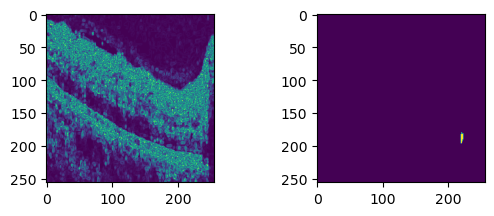

In [13]:
idx = random.randint(0, dataset.__len__()-1)

plt.subplot(2,2,1)
plt.imshow(dataset[idx][0][0])

plt.subplot(2,2,2)
plt.imshow(dataset[idx][1])

In [14]:
unlabeled_data, labeled_data = torch.utils.data.random_split(dataset, [unlabeled_size, labeled_size])
labeled_data, val_data = torch.utils.data.random_split(labeled_data, [final_labeled_size, validation_size])

In [15]:
unlabeled_dataloader = torch.utils.data.DataLoader(unlabeled_data, batch_size=batch_size_unlabeled, num_workers=2, shuffle=True)
labeled_dataloader = torch.utils.data.DataLoader(labeled_data, batch_size=batch_size_labeled, num_workers=2, shuffle=True)
val_dataloader = torch.utils.data.DataLoader(val_data, batch_size = batch_size_val, num_workers=2, shuffle=False)

In [16]:
student = StudentModel(in_channels, num_classes, encoder, encoder_weights).to(device)
teacher = TeacherModel(in_channels, num_classes, encoder, encoder_weights).to(device)

In [17]:
from segmentation_models_pytorch.losses import DiceLoss, FocalLoss

dice_loss = DiceLoss('multiclass')
focal_loss = FocalLoss('multiclass')

criterion = torch.nn.MSELoss()

In [19]:
optimizer = torch.optim.Adam(student.parameters(), lr= learning_rate, weight_decay=weight_decay)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, patience=2, factor=0.1,verbose=True)

C:\Users\adith\anaconda3\Lib\site-packages\torch\optim\lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


In [20]:
scaler = torch.cuda.amp.GradScaler()

In [21]:
def validation_step(val_dataloader, model, num_classes):
    
    loop = tqdm(val_dataloader, leave = True)
        
    count  = 0
    running_loss = 0.0
    running_iou = 0.0
        
    for image, mask in loop:
        
        with torch.no_grad():
            
            model.eval()
        
            image = image.to(device)
            mask = mask.to(device)

            pred = model(image.float())

            loss = dice_loss(pred, mask.long()) + focal_loss(pred, mask.long())

            iou_score = torch.mean(iou(torch.argmax(pred, dim = 1), masks.long(), num_classes=num_classes))
            
            running_loss += loss
            running_iou += iou_score

            count += 1
        
    return (running_loss / count , running_iou / count)

In [22]:
optim_step = 0
LAMBDA_PREV = 0.0

for epoch in range(epochs):
    
    running_loss = 0.0
    running_iou = 0.0
    count = 0
    
    for unlabeled_batch, labeled_batch in tqdm(zip(unlabeled_dataloader, labeled_dataloader), leave = True, total = int(unlabeled_size / batch_size_unlabeled)):
        
        student.train()
        teacher.train()
        
        labeled_images, masks = labeled_batch
        unlabeled_images, unlabeled_masks = unlabeled_batch
        
        labeled_images = labeled_images.to(device)
        masks = masks.to(device)
        unlabeled_images = unlabeled_images.to(device)
        unlabeled_masks = unlabeled_masks.to(device)
        
        student_unlabeled = unlabeled_images + (0.01**0.5)*torch.randn_like(unlabeled_images).to(device)
        teacher_unlabeled = unlabeled_images + (0.01**0.5)*torch.randn_like(unlabeled_images).to(device)
        
        student_labeled = labeled_images + (0.01**0.5)*torch.randn_like(labeled_images).to(device)

        
        with torch.cuda.amp.autocast():
        
            student_pred_labeled = student(student_labeled.float())
            student_pred = student(student_unlabeled.float())
            teacher_pred = teacher(teacher_unlabeled.float())

            consistency_loss = criterion(student_pred, teacher_pred)
            dice = dice_loss(student_pred_labeled, masks.long())
            focal = focal_loss(student_pred_labeled, masks.long())
            supervised_loss = dice + focal

            LAMBDA = get_current_consistency_weight(epoch)
            
            loss = LAMBDA * consistency_loss + supervised_loss
            iou_score = torch.mean(iou(torch.argmax(student_pred, dim = 1), unlabeled_masks.long(), num_classes=num_classes))
            
        student.zero_grad()
        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()
        
        running_loss += loss.item()
        running_iou += iou_score
        count += 1
        optim_step += 1
        
        if LAMBDA_PREV != LAMBDA:
            ALPHA = min(1 - 1 / (optim_step + 1), ALPHA_RAMPUP)
        
        else:
            ALPHA = min(1 - 1 / (optim_step + 1), ALPHA_TRAIN)
        
        for param_stu, param_tea in zip(student.parameters(), teacher.parameters()):
            param_tea.data = ALPHA * param_tea.data + (1.0 - ALPHA) * param_stu.data
            
    val_loss, val_iou = validation_step(val_dataloader, student, num_classes) 
    
    print(f"EPOCH: {epoch+1}\nLOSS: {running_loss / count} IOU: {running_iou / count}\nVAL_LOSS: {val_loss} VAL_IOU: {val_iou}")
    
    LAMBDA_PREV = LAMBDA    
    scheduler.step(running_loss / count)
    
    torch.save(student.state_dict(), 'student.pth')
    torch.save(teacher.state_dict(), 'teacher.pth')

In [22]:
# This part of the notebook is used to test the individual models and obtain their dice coefficient and mean iou score on the
# validation data along with the output masks

# The saved models are renamed and put into the respective folders as in the repository

# To test vgg19, use 'vgg19' as the test_model below and 'resnet' for resnet50

In [23]:
test_model = 'vgg19'

In [24]:
if test_model == 'resnet':

    encoder = 'resnet50'
    encoder_weights = 'imagenet'


    student = StudentModel(in_channels, num_classes, encoder, encoder_weights).to(device)
    teacher = TeacherModel(in_channels, num_classes, encoder, encoder_weights).to(device)

    student.load_state_dict(torch.load('Resnet50/resnet50_200epochs_student.pth',map_location=device))
    teacher.load_state_dict(torch.load('Resnet50/resnet50_200epochs_teacher.pth',map_location=device))
    print("Resnet50 chosen...")
    
if test_model == 'vgg19':

    encoder = 'vgg19_bn'
    encoder_weights = 'imagenet'


    student = StudentModel(in_channels, num_classes, encoder, encoder_weights).to(device)
    teacher = TeacherModel(in_channels, num_classes, encoder, encoder_weights).to(device)

    student.load_state_dict(torch.load('VGG19_bn/VGG19_200epochs_student.pth',map_location=device))
    teacher.load_state_dict(torch.load('VGG19_bn/VGG19_200epochs_teacher.pth',map_location=device))
    print("VGG19 chosen...")

VGG19 chosen...


C:\Users\adith\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1511: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Dice Coefficient Classwise [0.9698047041893005, 0.0059264227747917175, 0.005683720577508211, 0.5613589286804199]

IoU Score: 0.33856111764907837


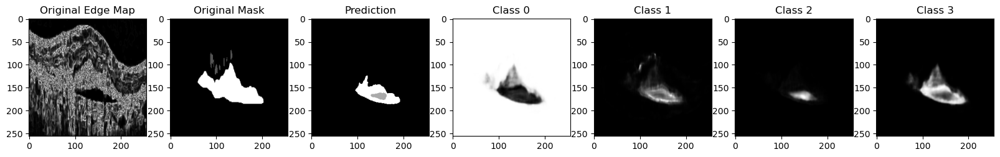

Dice Coefficient Classwise [0.9918264150619507, 0.01119955163449049, 0.3005369305610657, 0.5638173222541809]

IoU Score: 0.3991304636001587


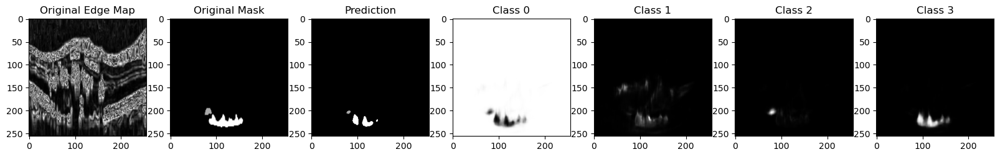

Dice Coefficient Classwise [0.9725320339202881, 0.45198535919189453, 0.6688851118087769, 0.11512622982263565]

IoU Score: 0.48776572942733765


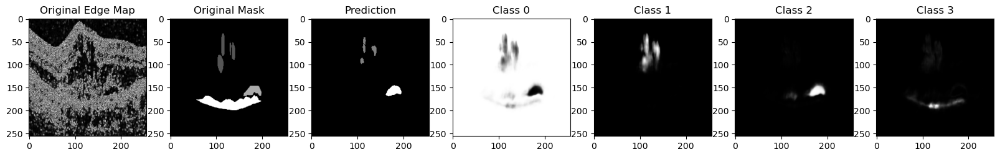

Dice Coefficient Classwise [0.9895275831222534, 0.005661772098392248, 0.23778973519802094, 0.8234342932701111]

IoU Score: 0.4402333199977875


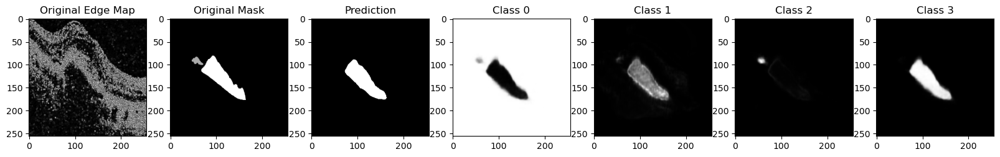

Dice Coefficient Classwise [0.9642216563224792, 0.4725514054298401, 0.8452984094619751, 0.7622508406639099]

IoU Score: 0.6964645385742188


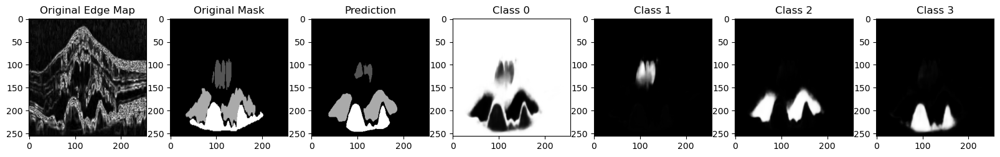

Dice Coefficient Classwise [0.9999211430549622, 3.6300451533577416e-09, 3.444751595083062e-09, 2.137926502498999e-09]

IoU Score: 1.0


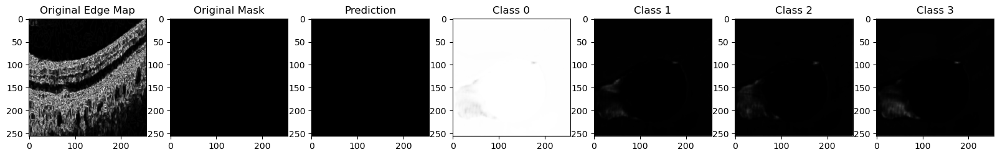

Dice Coefficient Classwise [0.9860348701477051, 0.002790892729535699, 0.9457241296768188, 3.098579726135142e-10]

IoU Score: 0.7234259843826294


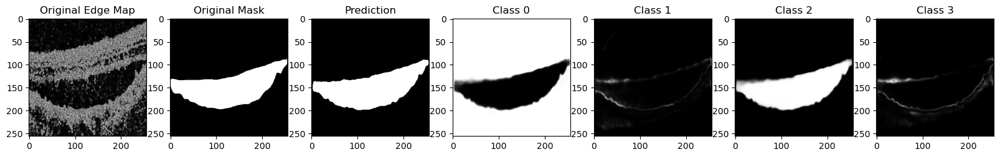

Dice Coefficient Classwise [0.9710110425949097, 0.5262891054153442, 0.5690836906433105, 0.006637572310864925]

IoU Score: 0.475761353969574


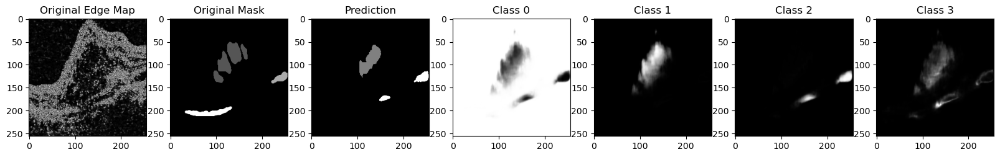

Dice Coefficient Classwise [0.9816725850105286, 0.6747374534606934, 0.6833778023719788, 8.515135124786966e-11]

IoU Score: 0.7981230020523071


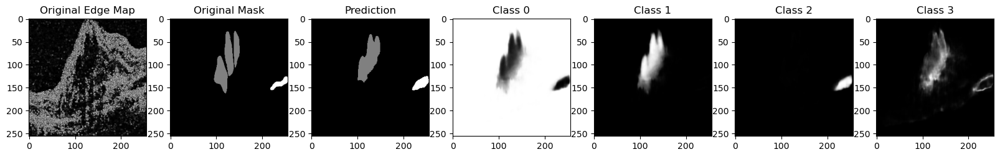

Dice Coefficient Classwise [0.9827007055282593, 0.03417845815420151, 1.1637303343192684e-09, 6.458854562296779e-10]

IoU Score: 0.7414131164550781


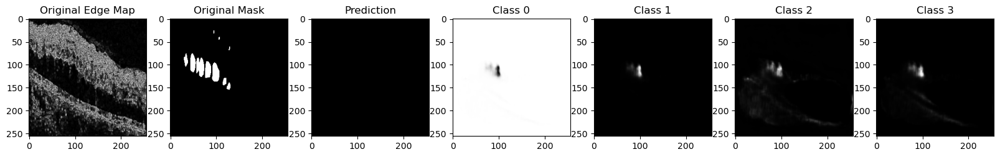

Dice Coefficient Classwise [0.9691876173019409, 0.3673270046710968, 0.701729953289032, 0.07209386676549911]

IoU Score: 0.43074730038642883


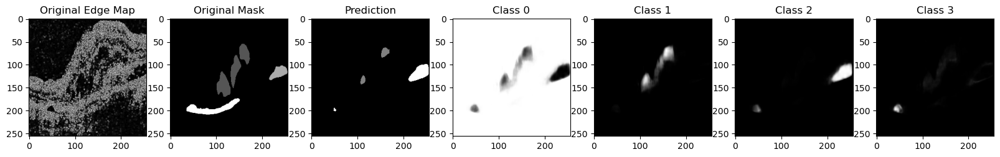

Dice Coefficient Classwise [0.982843279838562, 0.00646613584831357, 0.9309543967247009, 0.27989819645881653]

IoU Score: 0.46664220094680786


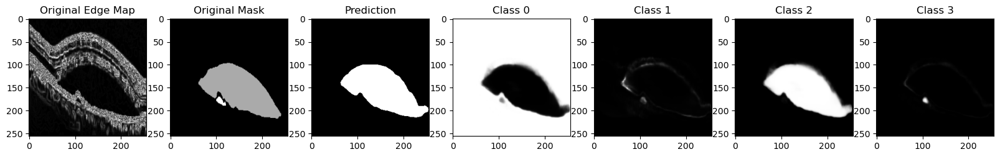

Dice Coefficient Classwise [0.9721550345420837, 0.029444333165884018, 0.5474934577941895, 0.7352635860443115]

IoU Score: 0.501461923122406


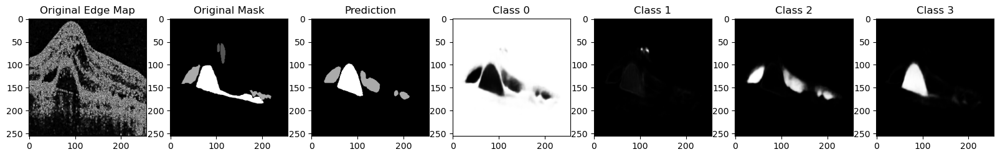

Dice Coefficient Classwise [0.9805482029914856, 0.0055475435219705105, 0.7546222805976868, 0.7169240117073059]

IoU Score: 0.5818421840667725


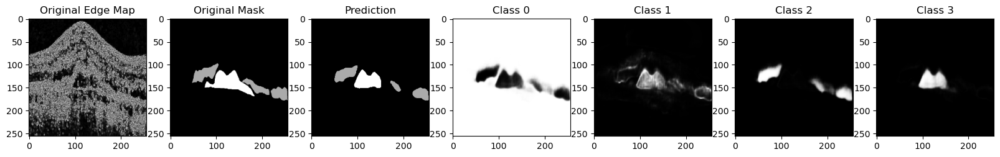

Dice Coefficient Classwise [0.9969529509544373, 0.00019541445362847298, 0.0005836968775838614, 0.004591458477079868]

IoU Score: 0.24856185913085938


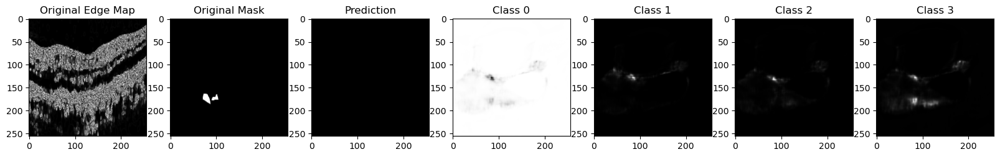

Dice Coefficient Classwise [0.9742776155471802, 0.08392134308815002, 0.014315937645733356, 0.9004630446434021]

IoU Score: 0.47213855385780334


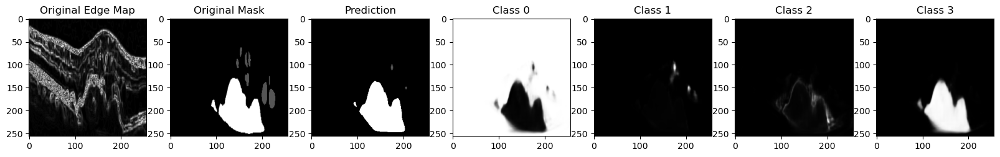

Dice Coefficient Classwise [0.9661344885826111, 0.3270553946495056, 0.6466233134269714, 0.25248879194259644]

IoU Score: 0.4604526460170746


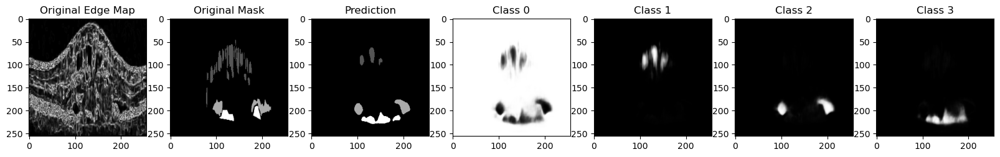

Dice Coefficient Classwise [0.980983316898346, 0.0062713902443647385, 0.8578252792358398, 0.7919363975524902]

IoU Score: 0.6368204355239868


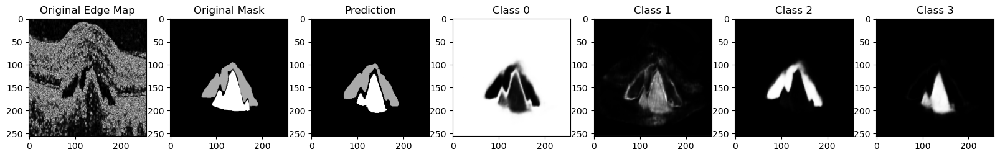

Dice Coefficient Classwise [0.9917192459106445, 0.003701140871271491, 0.010449307970702648, 0.5759347677230835]

IoU Score: 0.3634747862815857


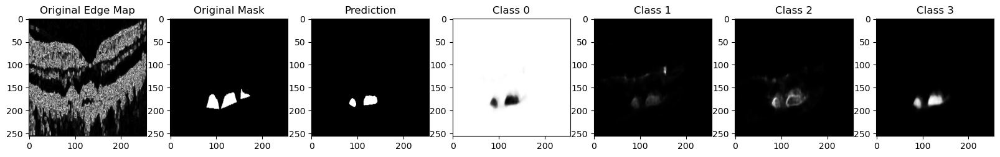

Dice Coefficient Classwise [0.9674665927886963, 0.0023043763358145952, 0.593959391117096, 0.3091750741004944]

IoU Score: 0.39682912826538086


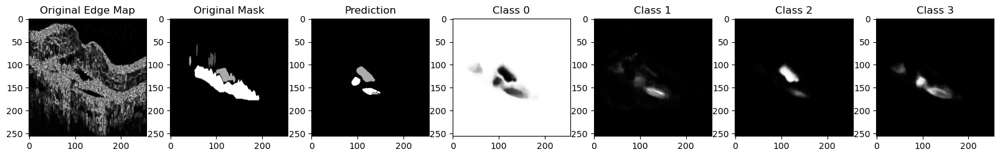

Dice Coefficient Classwise [0.9483585357666016, 0.3530139625072479, 0.877709686756134, 0.3336874544620514]

IoU Score: 0.5220233201980591


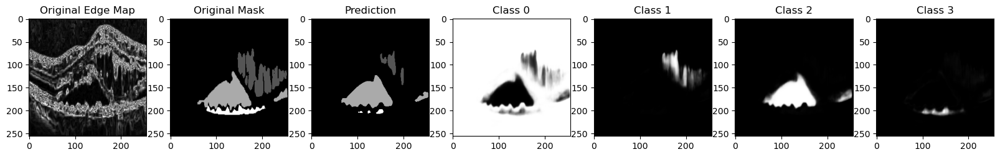

Dice Coefficient Classwise [0.9616776704788208, 0.0018012531800195575, 0.6880002617835999, 0.3005163371562958]

IoU Score: 0.4278184175491333


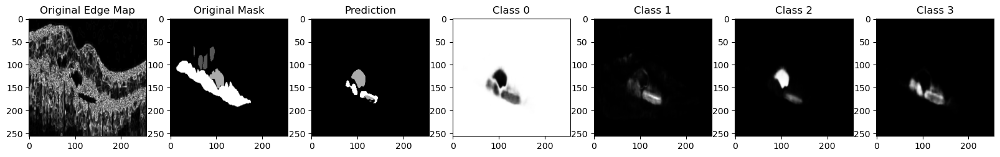

Dice Coefficient Classwise [0.9936190843582153, 0.012659191153943539, 3.368484158272622e-09, 1.897328294475642e-09]

IoU Score: 0.7468376159667969


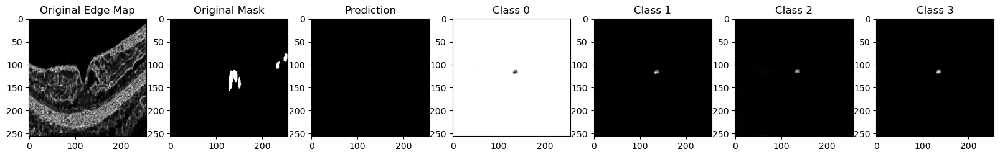

Dice Coefficient Classwise [0.978053092956543, 0.11718330532312393, 0.007797829806804657, 0.4372459650039673]

IoU Score: 0.3119201064109802


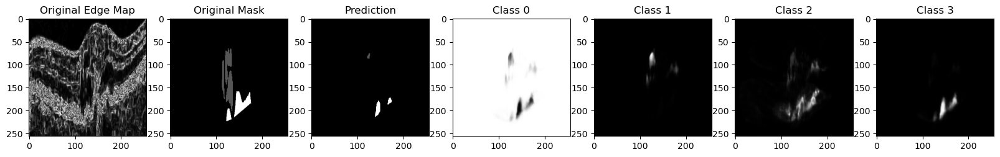

Dice Coefficient Classwise [0.9999507665634155, 5.4262332405130564e-09, 5.435290884037158e-09, 3.6057403729472526e-09]

IoU Score: 1.0


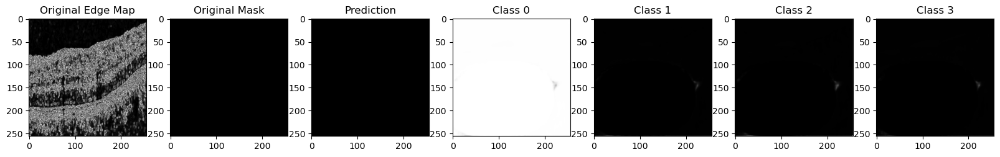

Dice Coefficient Classwise [0.995469331741333, 0.003581468714401126, 0.5584092140197754, 1.5642742656751807e-10]

IoU Score: 0.6170305013656616


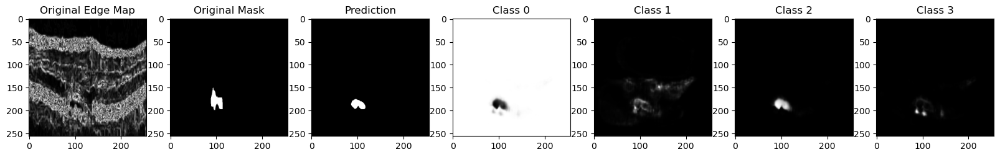

Dice Coefficient Classwise [0.9816937446594238, 0.021704673767089844, 0.011331469751894474, 0.5021001696586609]

IoU Score: 0.338487833738327


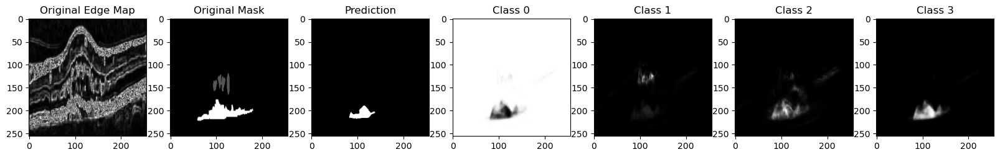

Dice Coefficient Classwise [0.9711300730705261, 0.011165984906256199, 0.8184924721717834, 0.8658696413040161]

IoU Score: 0.6470149755477905


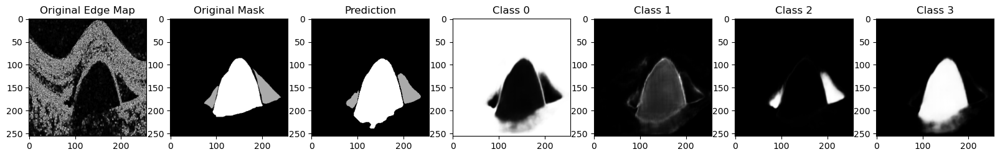

Dice Coefficient Classwise [0.9896960258483887, 0.004318696912378073, 0.6801185607910156, 0.002683142898604274]

IoU Score: 0.38773226737976074


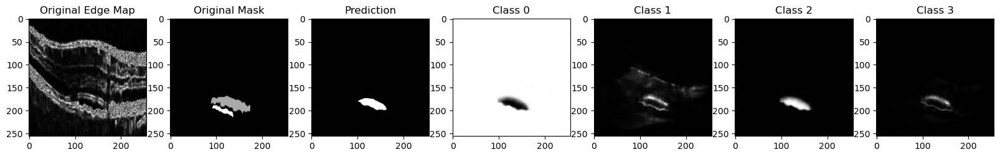

Dice Coefficient Classwise [0.9999299645423889, 4.025930699924629e-09, 3.726738917464445e-09, 2.4943427323620426e-09]

IoU Score: 1.0


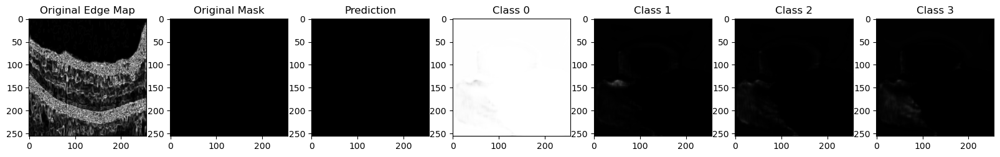

Dice Coefficient Classwise [0.9821345806121826, 0.0110037075355649, 0.8421140909194946, 0.919863224029541]

IoU Score: 0.682301938533783


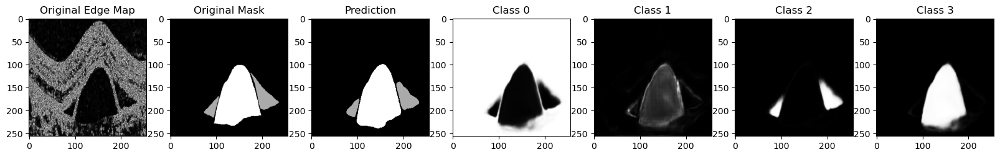

Dice Coefficient Classwise [0.9833241701126099, 0.005377467721700668, 0.8919529318809509, 0.8362544775009155]

IoU Score: 0.6629415154457092


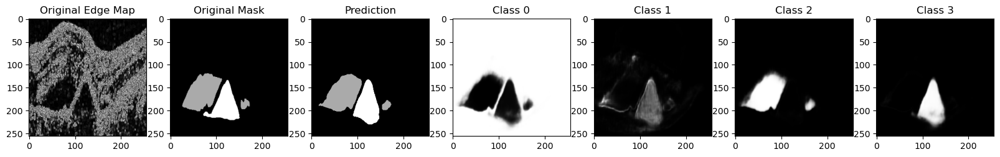

Dice Coefficient Classwise [0.9774463772773743, 0.4667319059371948, 0.004647547844797373, 0.597327470779419]

IoU Score: 0.4455493688583374


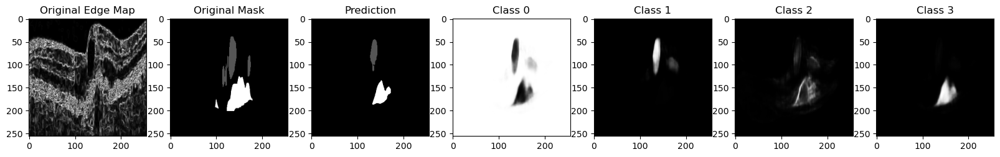

Dice Coefficient Classwise [0.9991956353187561, 1.5583615509129345e-09, 1.190473553069893e-10, 6.699239496477105e-10]

IoU Score: 1.0


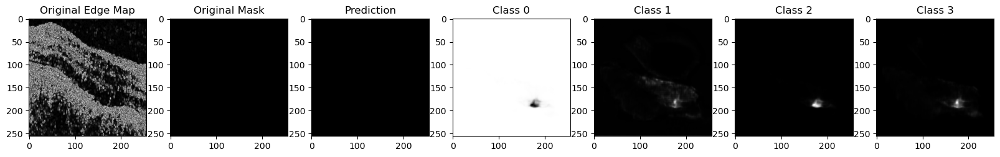

Dice Coefficient Classwise [0.9847596883773804, 0.009401238523423672, 0.8587093949317932, 2.457615499995569e-10]

IoU Score: 0.7006092667579651


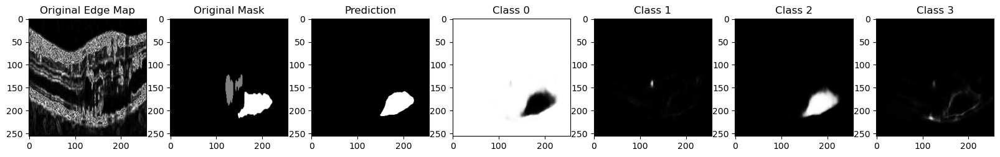

Dice Coefficient Classwise [0.9916173219680786, 0.004090334754437208, 0.9171125292778015, 2.3987040131956405e-10]

IoU Score: 0.7212144136428833


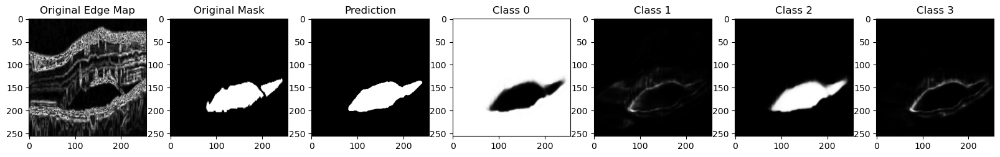

Dice Coefficient Classwise [0.9890053272247314, 0.0026620954740792513, 0.8627477884292603, 0.05482387915253639]

IoU Score: 0.442991703748703


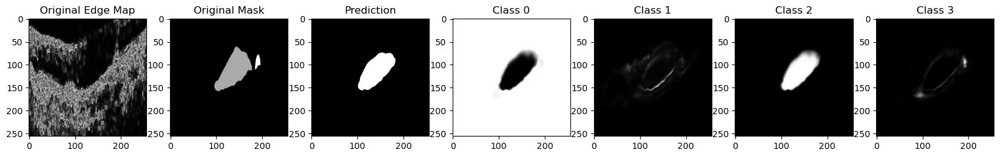

Dice Coefficient Classwise [0.9763748049736023, 0.47358888387680054, 0.38176459074020386, 8.56888171529846e-11]

IoU Score: 0.6174440979957581


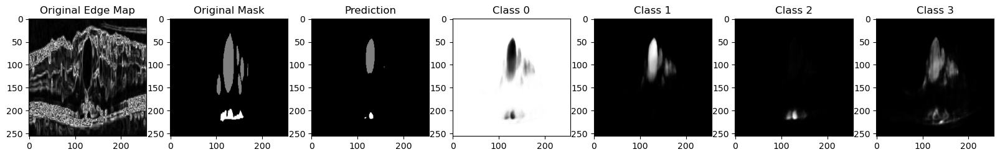

Dice Coefficient Classwise [0.9969209432601929, 3.6396896607726603e-09, 8.731317002741434e-09, 3.3250621006564174e-11]

IoU Score: 0.2484893798828125


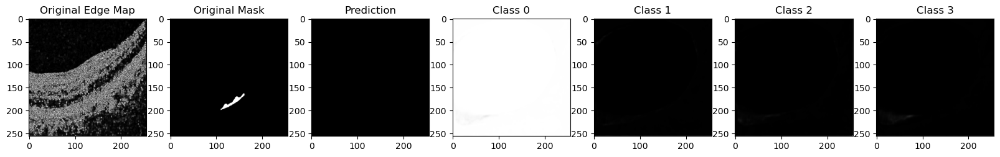

Dice Coefficient Classwise [0.9654327034950256, 0.013471291400492191, 0.6805172562599182, 0.3341059982776642]

IoU Score: 0.42682212591171265


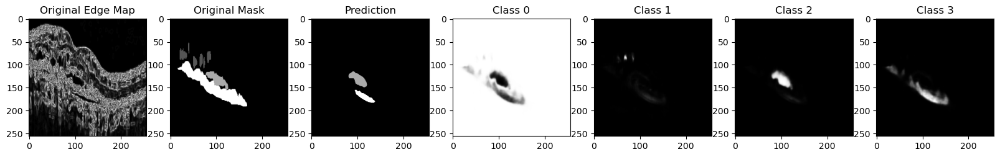

Dice Coefficient Classwise [0.9694700241088867, 0.41953372955322266, 0.0031570899300277233, 0.862980842590332]

IoU Score: 0.5251709222793579


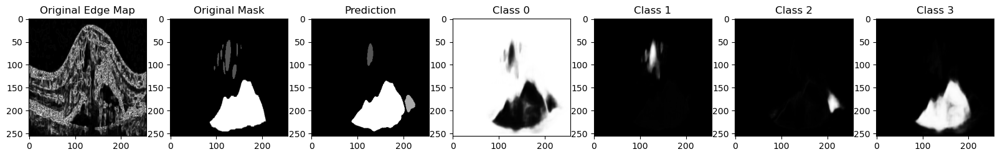

Dice Coefficient Classwise [0.9907287359237671, 0.0017149460036307573, 0.007469190750271082, 0.29061877727508545]

IoU Score: 0.2598533630371094


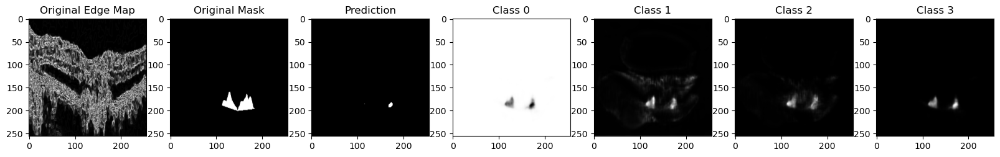

Dice Coefficient Classwise [0.9999307990074158, 5.0835313736286025e-09, 3.7925316220821514e-09, 2.2389747833528872e-09]

IoU Score: 1.0


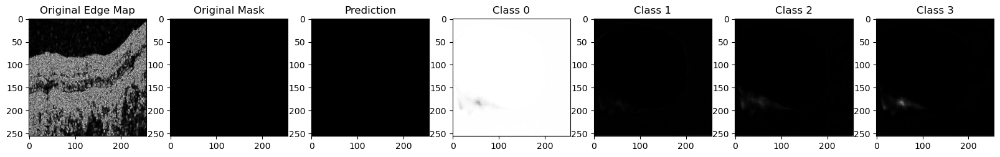

Dice Coefficient Classwise [0.9999116659164429, 2.9439037874112728e-09, 2.8825206666027725e-09, 2.1224939583674995e-09]

IoU Score: 1.0


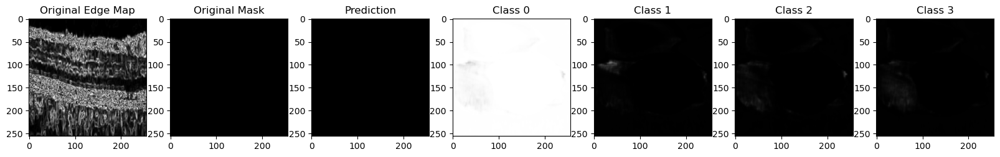

Dice Coefficient Classwise [0.9995566606521606, 4.175485173618654e-06, 2.9360383568821646e-10, 2.461400638864575e-09]

IoU Score: 0.49982452392578125


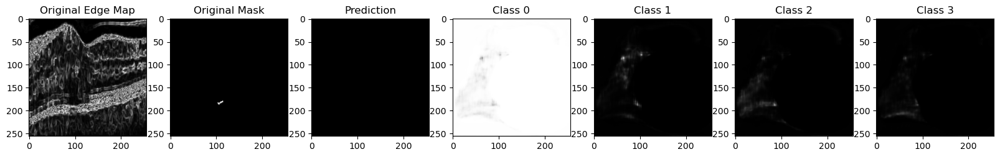

Dice Coefficient Classwise [0.9750038981437683, 0.28505969047546387, 0.660083532333374, 0.8650997281074524]

IoU Score: 0.6419630646705627


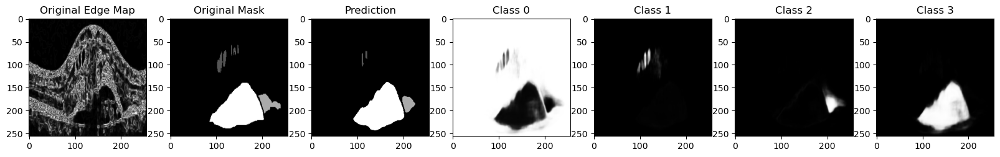

Dice Coefficient Classwise [0.9629466533660889, 0.006005375180393457, 0.8350411653518677, 0.7905719876289368]

IoU Score: 0.6118224859237671


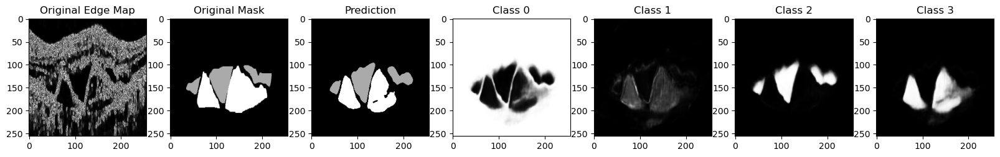

Dice Coefficient Classwise [0.9825365543365479, 0.008585449308156967, 0.8154274821281433, 0.9317039847373962]

IoU Score: 0.6790769100189209


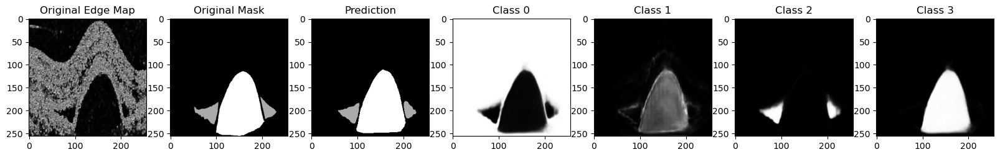

Dice Coefficient Classwise [0.996450662612915, 0.0007146446732804179, 0.0014293830608949065, 0.04820295050740242]

IoU Score: 0.24833297729492188


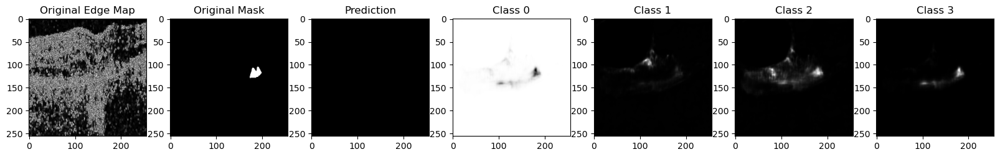

Dice Coefficient Classwise [0.9807345867156982, 0.01066756434738636, 0.8792876601219177, 0.9057076573371887]

IoU Score: 0.6847929358482361


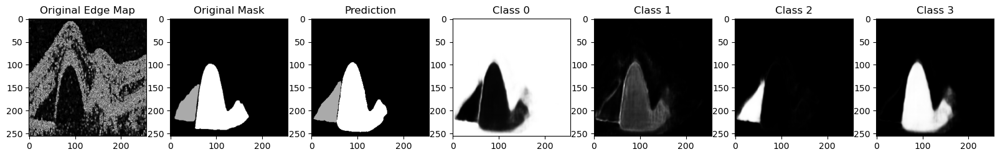

Dice Coefficient Classwise [0.9911612272262573, 0.010456341318786144, 0.8220130801200867, 1.6746977415937891e-10]

IoU Score: 0.6839412450790405


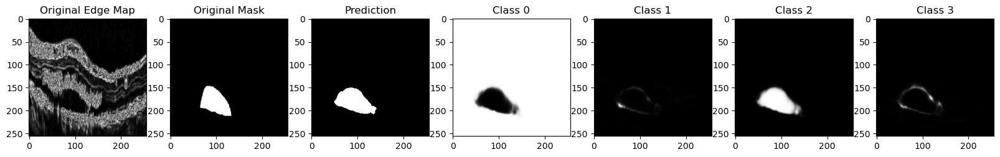

Dice Coefficient Classwise [0.9944133758544922, 0.18822962045669556, 7.582403593886511e-10, 5.378874012862411e-10]

IoU Score: 0.7496472597122192


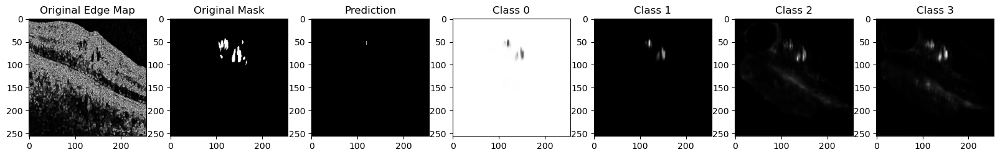

Dice Coefficient Classwise [0.9784579873085022, 0.003476050216704607, 0.9218531847000122, 0.1805092990398407]

IoU Score: 0.46788668632507324


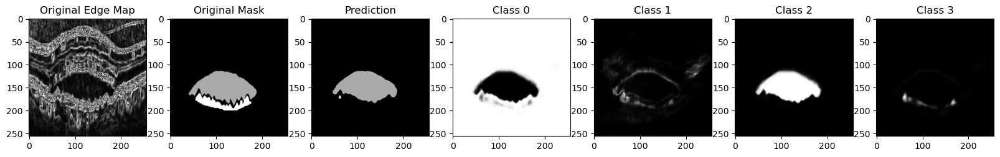

Dice Coefficient Classwise [0.9902416467666626, 0.00044333405094221234, 0.035114407539367676, 0.015526149421930313]

IoU Score: 0.24529647827148438


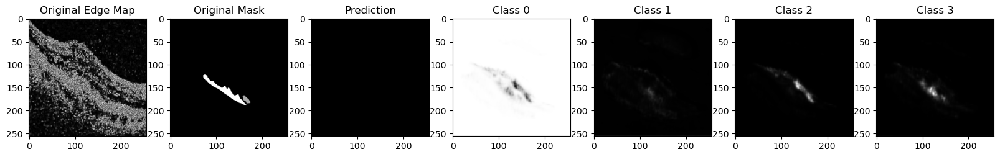

Dice Coefficient Classwise [0.9880569577217102, 0.007680773269385099, 0.7443680763244629, 0.8331708312034607]

IoU Score: 0.6610671281814575


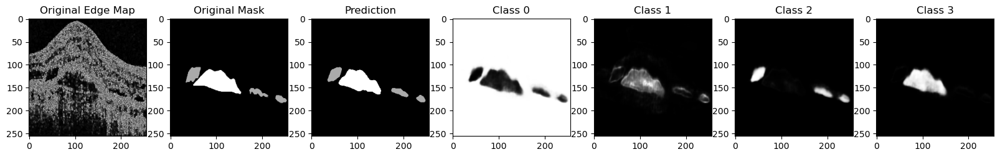

Dice Coefficient Classwise [0.9916133880615234, 0.0021401233971118927, 0.010974613018333912, 0.5498042106628418]

IoU Score: 0.34273582696914673


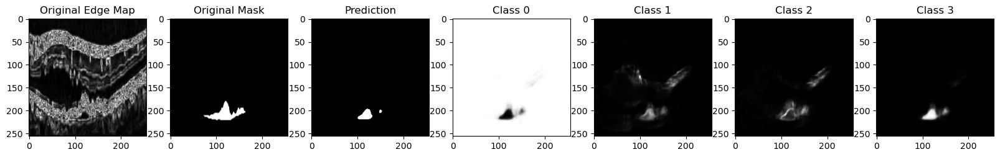

Dice Coefficient Classwise [0.9621913433074951, 0.006602621171623468, 0.8269687294960022, 0.793300449848175]

IoU Score: 0.6210575103759766


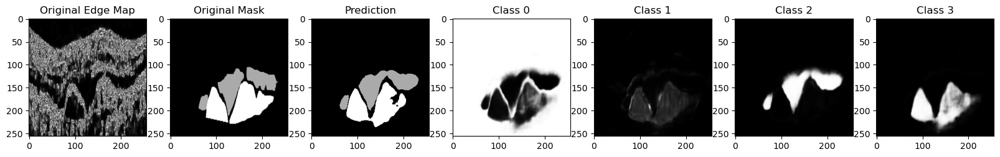

Dice Coefficient Classwise [0.9825613498687744, 0.0023770511616021395, 0.7158921360969543, 0.2160196602344513]

IoU Score: 0.4379073977470398


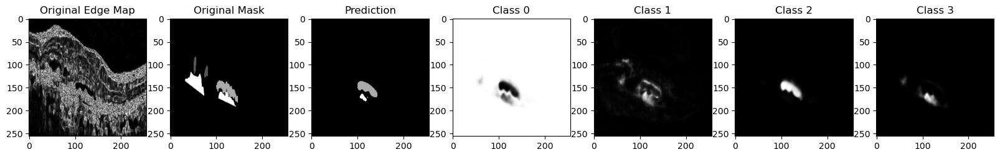

Dice Coefficient Classwise [0.9959114193916321, 0.0036414791829884052, 0.014012320898473263, 0.6922051906585693]

IoU Score: 0.4117090106010437


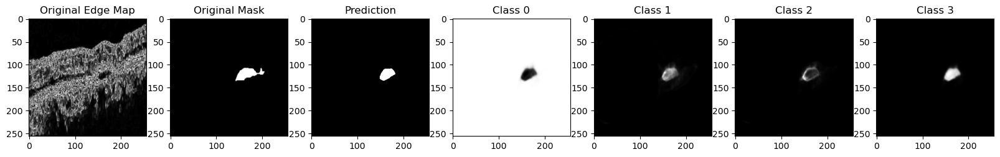

Dice Coefficient Classwise [0.9595434069633484, 0.007820477709174156, 0.7113139629364014, 0.8918150663375854]

IoU Score: 0.6066169738769531


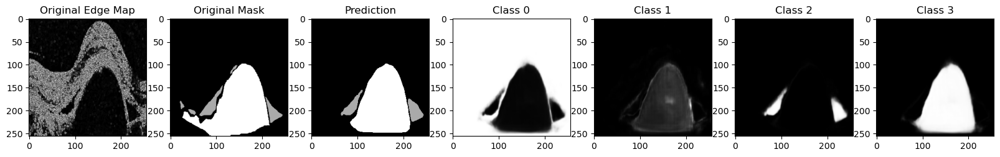

Dice Coefficient Classwise [0.9921456575393677, 0.004164567217230797, 0.012183578684926033, 0.6588035225868225]

IoU Score: 0.39332276582717896


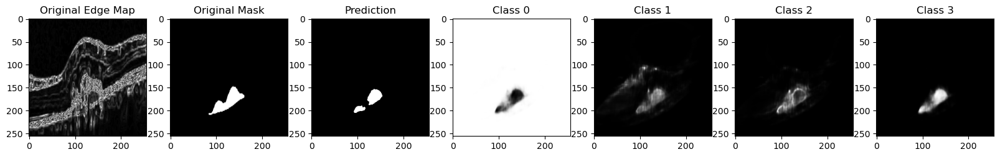

Dice Coefficient Classwise [0.9938790798187256, 0.0032425574027001858, 0.8505550622940063, 4.044925783208697e-10]

IoU Score: 0.6924124956130981


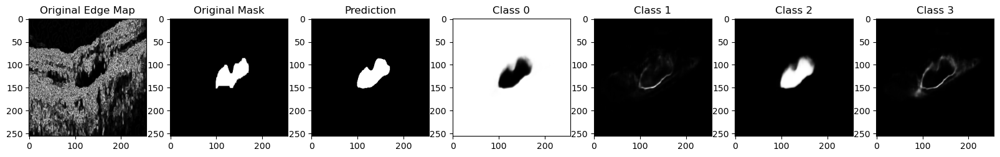

Dice Coefficient Classwise [0.9712124466896057, 0.0027242142241448164, 0.9407719969749451, 0.14013417065143585]

IoU Score: 0.46782153844833374


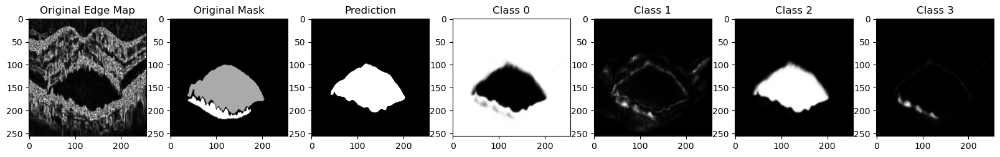

Dice Coefficient Classwise [0.9564507007598877, 0.5988248586654663, 0.7992520332336426, 6.812868325045685e-11]

IoU Score: 0.8033363819122314


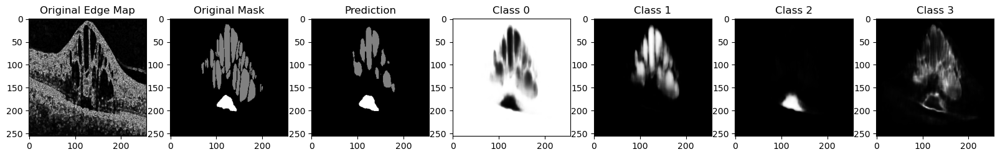

Dice Coefficient Classwise [0.9589481949806213, 0.00269110593944788, 0.007317043840885162, 0.8628566861152649]

IoU Score: 0.4478227496147156


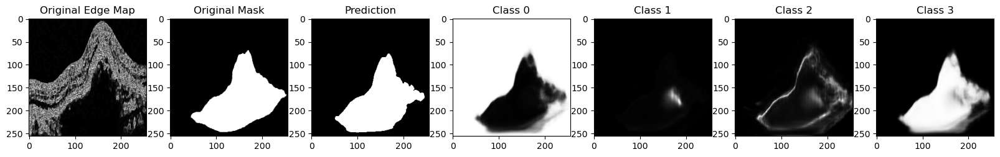

Dice Coefficient Classwise [0.9884377717971802, 0.001991810044273734, 0.7206653952598572, 2.566163115336195e-10]

IoU Score: 0.6616721153259277


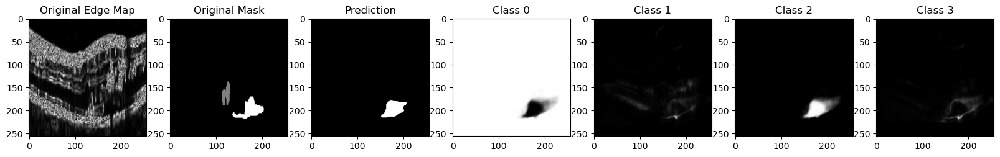

Dice Coefficient Classwise [0.9999523758888245, 6.210302050391192e-09, 4.901145267410811e-09, 3.854414121207128e-09]

IoU Score: 1.0


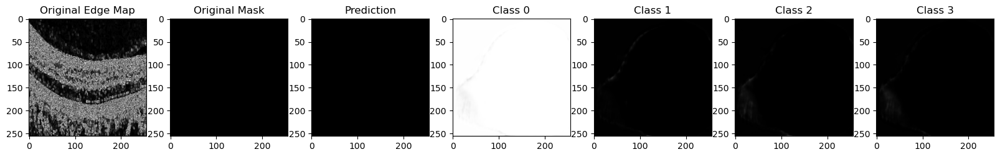

Dice Coefficient Classwise [0.9784430861473083, 0.48808181285858154, 1.9737826650878532e-10, 7.180944727736005e-11]

IoU Score: 0.8377996683120728


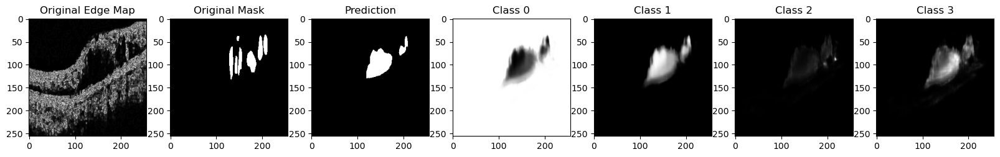

Dice Coefficient Classwise [0.993683934211731, 0.0005841676029376686, 0.0007857836899347603, 0.008715045638382435]

IoU Score: 0.24701690673828125


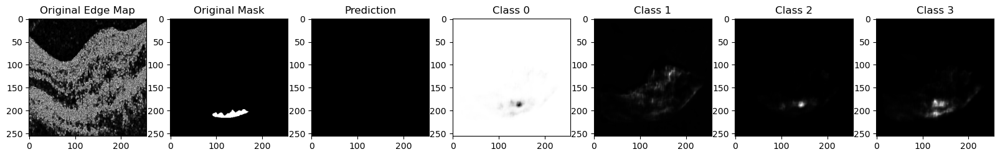

Dice Coefficient Classwise [0.9966272115707397, 0.0025805316399782896, 0.6437743902206421, 4.268701503384875e-10]

IoU Score: 0.6259347796440125


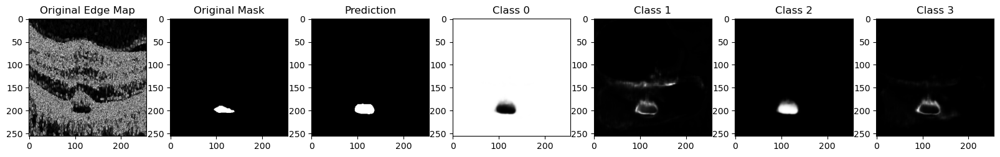

Dice Coefficient Classwise [0.9975680708885193, 1.3648771357566147e-07, 4.588043278630494e-09, 3.1819491486118068e-09]

IoU Score: 0.7488174438476562


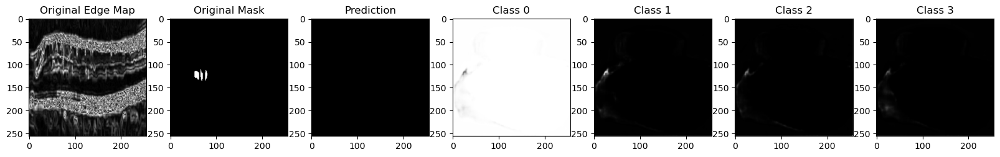

Dice Coefficient Classwise [0.9982402920722961, 0.00016537292685825378, 0.00022124221140984446, 0.002147449180483818]

IoU Score: 0.24920272827148438


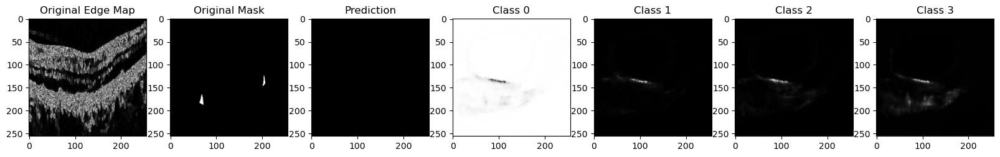

Dice Coefficient Classwise [0.9785152077674866, 0.003134076250717044, 0.8804607391357422, 1.815694122830891e-10]

IoU Score: 0.692284345626831


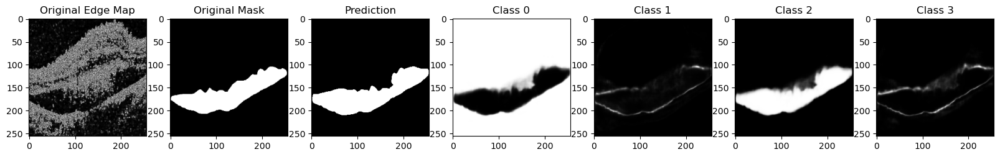

Dice Coefficient Classwise [0.9314240217208862, 0.3956848084926605, 0.5928678512573242, 0.6724015474319458]

IoU Score: 0.5458004474639893


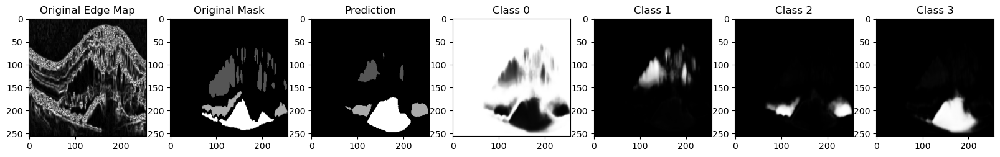

Dice Coefficient Classwise [0.9921894073486328, 0.0011487952433526516, 0.02179735153913498, 0.43637046217918396]

IoU Score: 0.3281759023666382


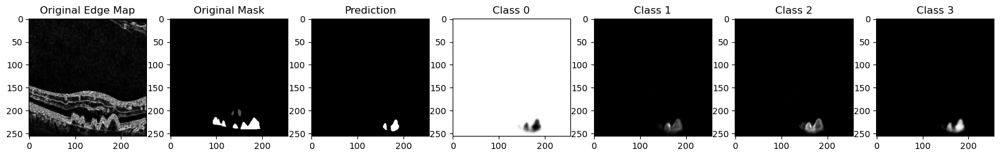

Dice Coefficient Classwise [0.9872749447822571, 0.0022015199065208435, 0.7540374994277954, 0.11210708320140839]

IoU Score: 0.4117630124092102


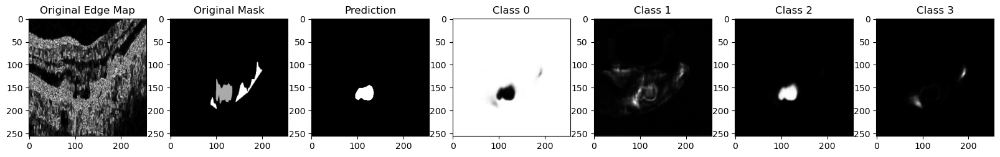

Dice Coefficient Classwise [0.99742591381073, 0.002405178267508745, 0.42944014072418213, 2.631946049991285e-10]

IoU Score: 0.5746193528175354


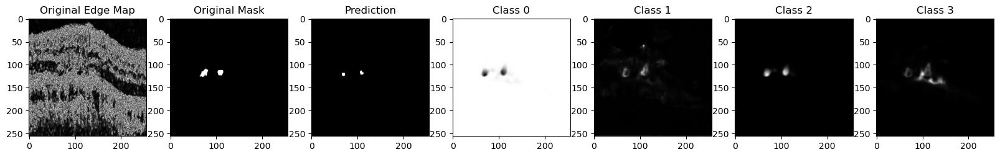

Dice Coefficient Classwise [0.9846125841140747, 0.002318848390132189, 0.7945841550827026, 0.35816678404808044]

IoU Score: 0.471569687128067


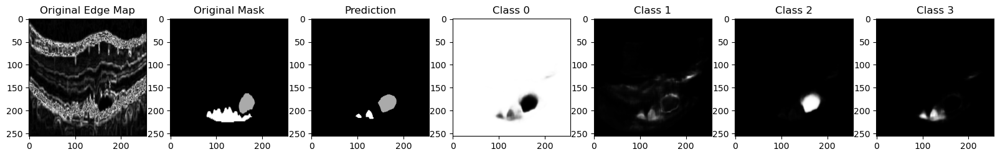

Dice Coefficient Classwise [0.9999418258666992, 4.987433577241518e-09, 4.744738379969249e-09, 2.8485360736851817e-09]

IoU Score: 1.0


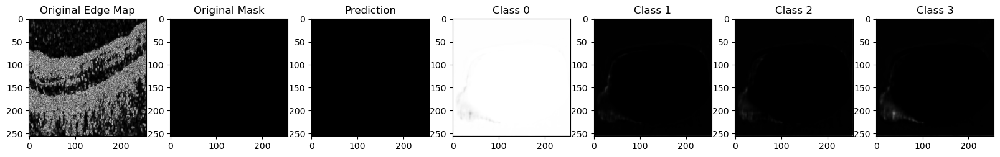

Dice Coefficient Classwise [0.9914425611495972, 0.030402177944779396, 3.192903719195783e-09, 1.723840514777919e-09]

IoU Score: 0.7457427978515625


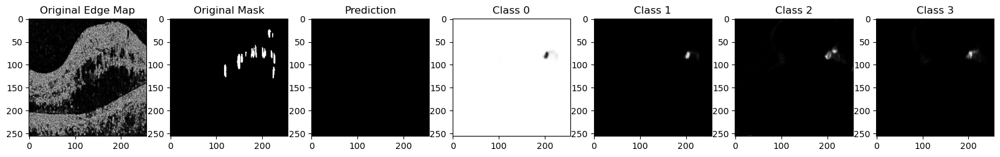

Dice Coefficient Classwise [0.9968121647834778, 0.013653828762471676, 3.2722775600291243e-09, 1.8937813539565695e-09]

IoU Score: 0.7484550476074219


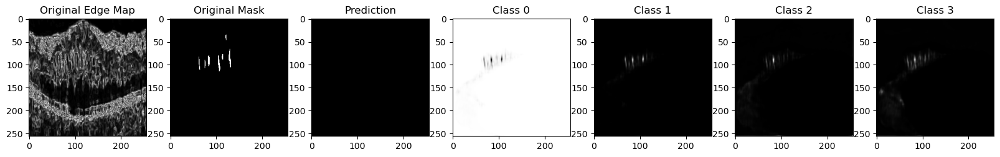

Dice Coefficient Classwise [0.9500156044960022, 0.005223446525633335, 0.8094035387039185, 0.7812128663063049]

IoU Score: 0.590408205986023


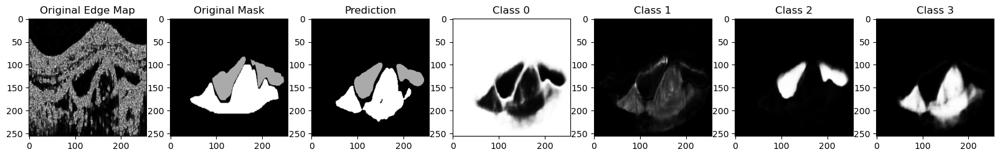

Dice Coefficient Classwise [0.9998428225517273, 2.7043305372842497e-09, 1.239678693032431e-09, 1.1318590509290516e-09]

IoU Score: 1.0


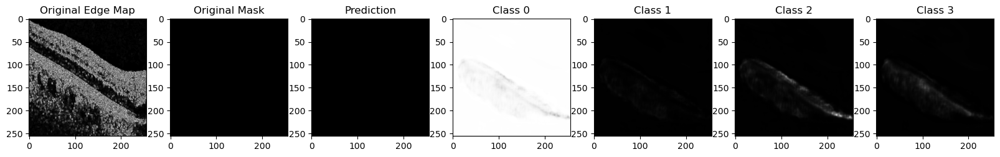

Dice Coefficient Classwise [0.9353386163711548, 0.008025922812521458, 0.6739778518676758, 0.6739208102226257]

IoU Score: 0.5399153232574463


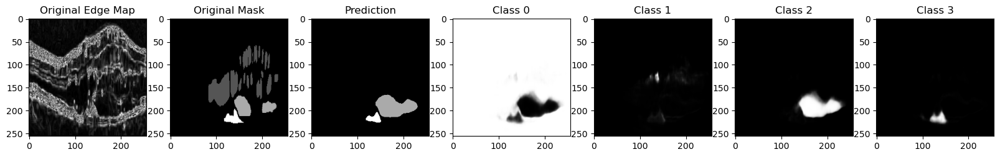

Dice Coefficient Classwise [0.9794237613677979, 0.002421463141217828, 0.9162167310714722, 2.3269554338956056e-10]

IoU Score: 0.7065315842628479


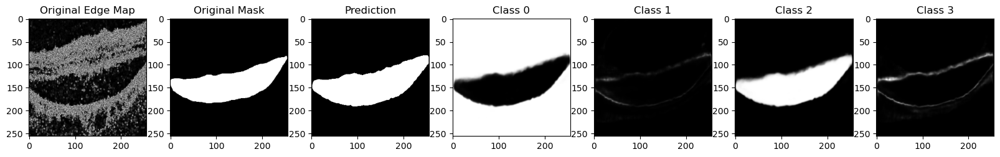

Dice Coefficient Classwise [0.9896870851516724, 0.005826220382004976, 0.2771303355693817, 0.8551055788993835]

IoU Score: 0.4619565010070801


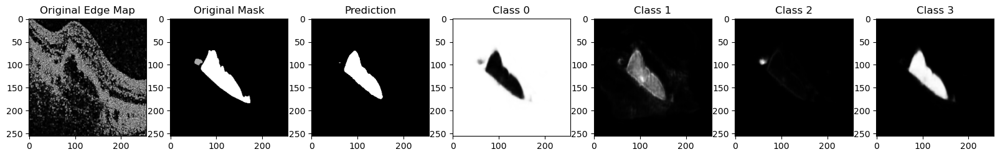

Dice Coefficient Classwise [0.9854089021682739, 0.005538177210837603, 0.736934244632721, 0.8158632516860962]

IoU Score: 0.6170586943626404


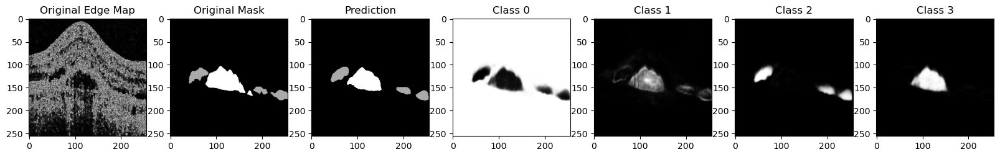

Dice Coefficient Classwise [0.9795812368392944, 0.007604663725942373, 0.7961426377296448, 0.926328718662262]

IoU Score: 0.6642552018165588


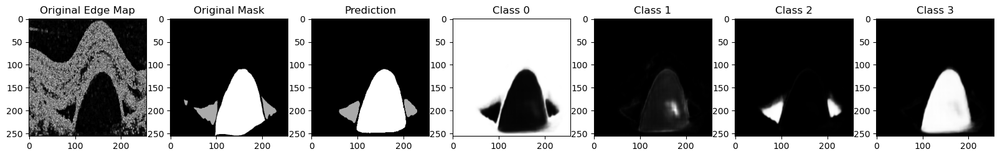

Dice Coefficient Classwise [0.9941002726554871, 0.00326607096940279, 3.80106524033863e-09, 2.40688824426627e-09]

IoU Score: 0.7470970153808594


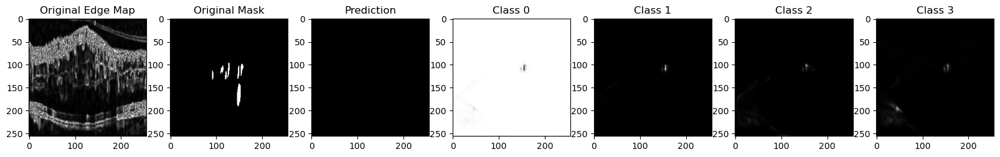

Dice Coefficient Classwise [0.9823899865150452, 0.008582746610045433, 0.9377781748771667, 0.503744900226593]

IoU Score: 0.5747738480567932


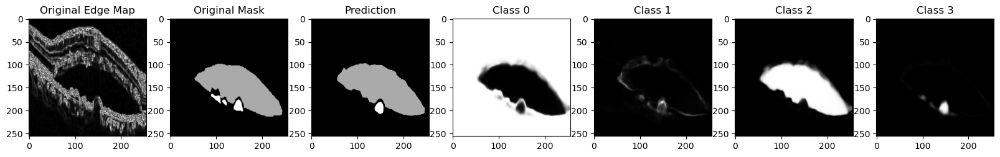

Dice Coefficient Classwise [0.9723107218742371, 0.009510858915746212, 0.7972298264503479, 0.9211176633834839]

IoU Score: 0.6497039794921875


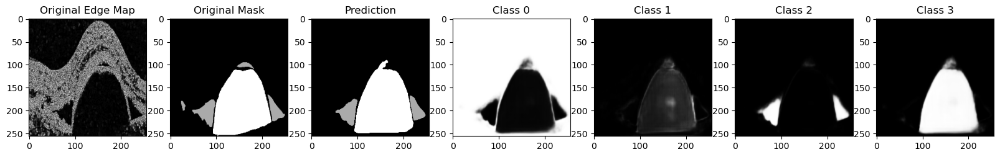

Dice Coefficient Classwise [0.9872368574142456, 0.5322752594947815, 0.0008112688665278256, 0.007066875696182251]

IoU Score: 0.3494439125061035


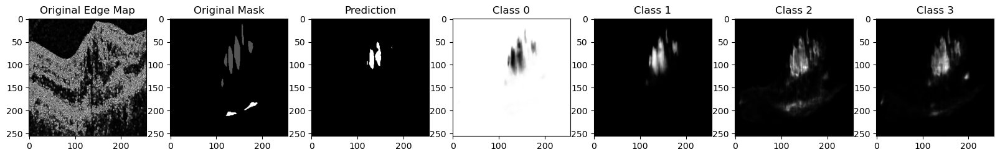

Dice Coefficient Classwise [0.9684052467346191, 0.536473274230957, 0.7395385503768921, 6.845462391380508e-11]

IoU Score: 0.7623695135116577


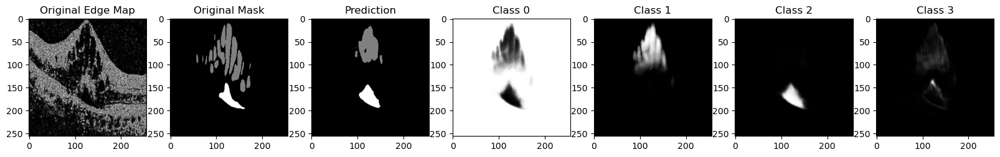

Dice Coefficient Classwise [0.952517569065094, 0.6067715883255005, 0.7036157250404358, 4.614851209505666e-11]

IoU Score: 0.7633544206619263


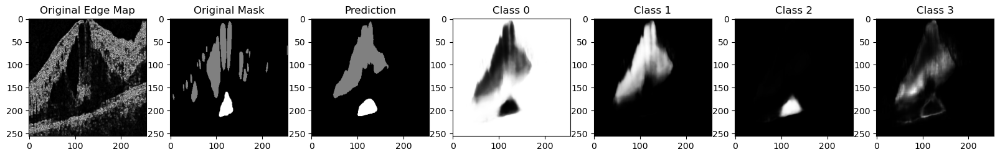

Dice Coefficient Classwise [0.9573366045951843, 0.5395082831382751, 0.09254100918769836, 6.406713354278892e-11]

IoU Score: 0.5761570334434509


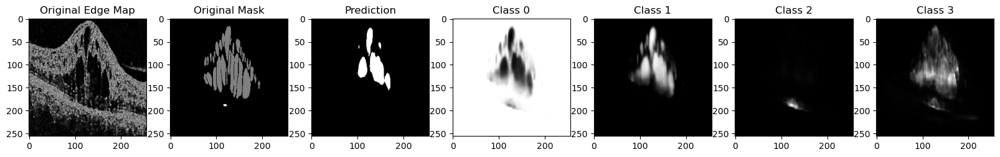

Dice Coefficient Classwise [0.9978429675102234, 9.703884416012443e-07, 4.882941162520638e-09, 3.4087528355541963e-09]

IoU Score: 0.7489509582519531


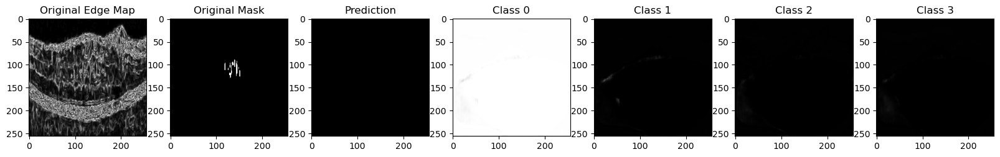

Dice Coefficient Classwise [0.9924202561378479, 0.004471633117645979, 0.3402855396270752, 3.2294383833786355e-10]

IoU Score: 0.5505495667457581


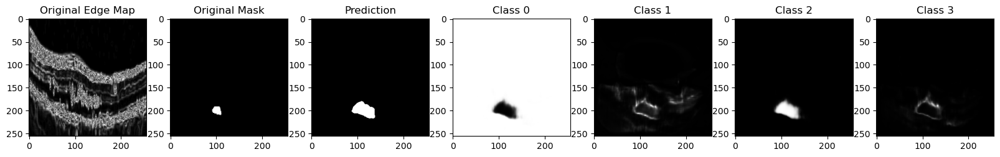

Dice Coefficient Classwise [0.9924325346946716, 0.002135091694071889, 0.322356253862381, 0.172127828001976]

IoU Score: 0.24721379578113556


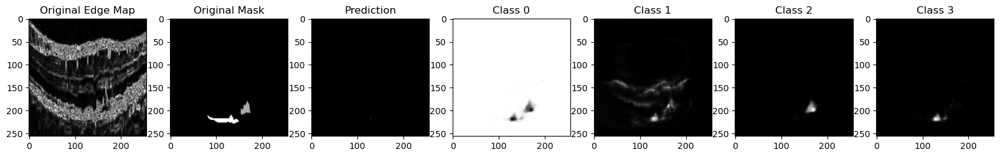

Dice Coefficient Classwise [0.9944714903831482, 0.0003026757622137666, 5.717214701661533e-09, 3.6341096798508943e-09]

IoU Score: 0.7472801208496094


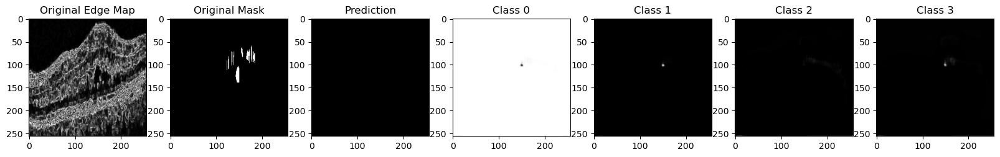

Dice Coefficient Classwise [0.9947853088378906, 0.007005022373050451, 0.913451075553894, 2.8870886237264415e-10]

IoU Score: 0.7223477363586426


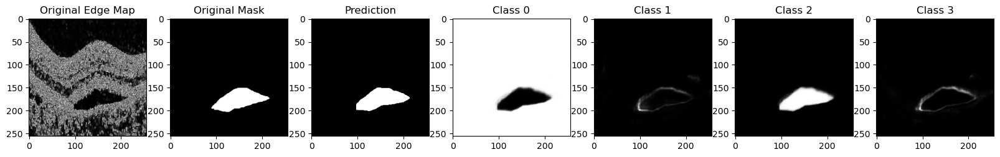

Dice Coefficient Classwise [0.9788178205490112, 0.008089769631624222, 0.8536249399185181, 0.8790030479431152]

IoU Score: 0.6594744920730591


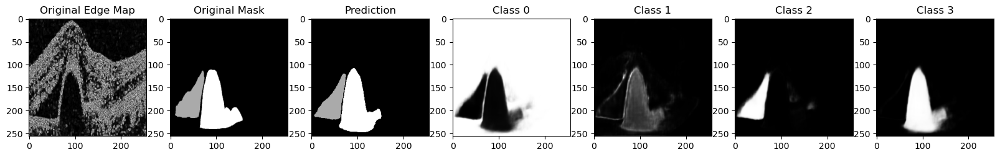

Dice Coefficient Classwise [0.991717517375946, 0.003354873275384307, 0.014997545629739761, 0.8011471629142761]

IoU Score: 0.44639286398887634


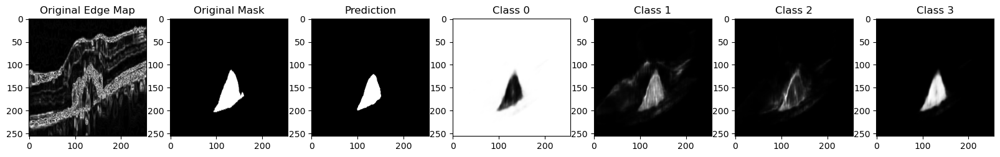

Dice Coefficient Classwise [0.995163083076477, 1.5956260618343876e-11, 6.051503742554587e-09, 3.905495038480922e-09]

IoU Score: 0.7476158142089844


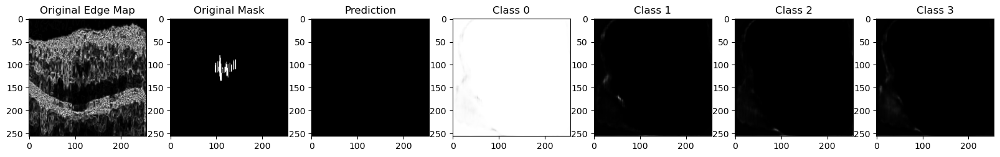

Dice Coefficient Classwise [0.9999573230743408, 6.053502143998912e-09, 6.310020950195394e-09, 4.239907536174314e-09]

IoU Score: 1.0


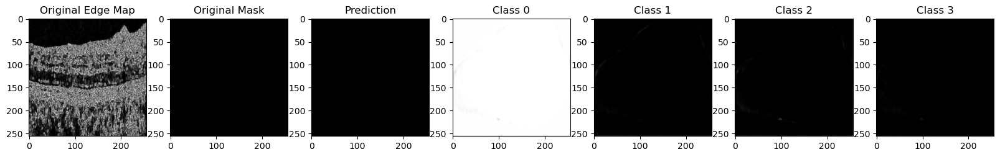

Dice Coefficient Classwise [0.9860117435455322, 0.005848402623087168, 0.8852524757385254, 0.8746665716171265]

IoU Score: 0.6800919771194458


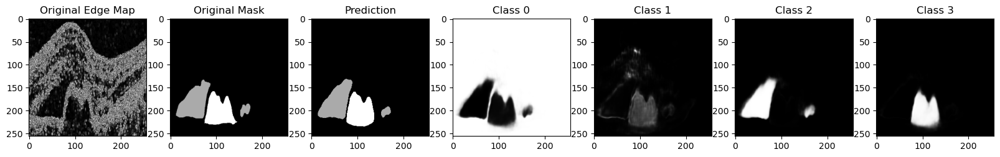

Dice Coefficient Classwise [0.9999340772628784, 4.279560705811036e-09, 3.783788837807833e-09, 2.7306801264614933e-09]

IoU Score: 1.0


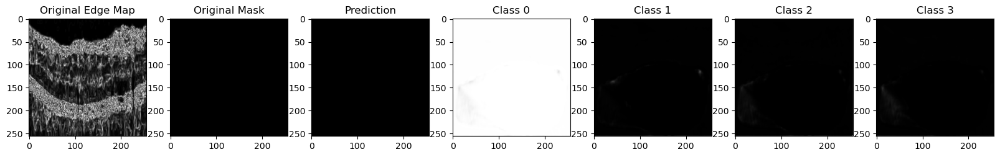

Dice Coefficient Classwise [0.9997169971466064, 6.400801066774875e-05, 1.2152480133309496e-09, 1.1252964116081898e-09]

IoU Score: 0.74993896484375


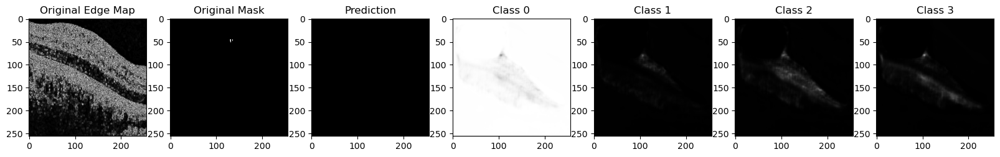

In [25]:
final_test_dice = [0.0]*num_classes
final_test_iou = 0.0

for idx in range(0,val_data.__len__()):

    sample = val_data[idx]

    student.eval()
    sample_image = torch.tensor(sample[0][0]).expand((1,1,img_dim,img_dim)).to(device)
    out = student(sample_image.float())

    dice_coeff = multiclass_dice(out, torch.tensor(sample[1]).expand((1,img_dim, img_dim)).long().to(device))
    iou_score = iou(torch.argmax(out, dim = 1), torch.tensor(sample[1]).expand(1,img_dim,img_dim).long().to(device),num_classes=num_classes).item()
    
    for i in range(num_classes):
        final_test_dice[i] += dice_coeff[i].item()
    
    final_test_iou += iou_score

    print(f"Dice Coefficient Classwise {[i.item() for i in dice_coeff]}")
    print(f"\nIoU Score: {iou_score}")

    plt.figure(figsize=(20,8))

    plt.subplot(2,7,1)
    plt.imshow(sample[0][0], cmap = 'gray')
    plt.title("Original Edge Map")

    plt.subplot(2,7,2)
    plt.imshow(sample[1], cmap = 'gray')
    plt.title("Original Mask")

    plt.subplot(2,7,3)
    plt.imshow(torch.argmax(out[0], dim = 0).detach().cpu().numpy(), cmap = 'gray')
    plt.title("Prediction")

    plt.subplot(2,7,4)
    plt.imshow(out[0][0].detach().cpu().numpy(), cmap = 'gray')
    plt.title("Class 0")

    plt.subplot(2,7,5)
    plt.imshow(out[0][1].detach().cpu().numpy(), cmap = 'gray')
    plt.title("Class 1")

    plt.subplot(2,7,6)
    plt.imshow(out[0][2].detach().cpu().numpy(), cmap = 'gray')
    plt.title("Class 2")

    plt.subplot(2,7,7)
    plt.imshow(out[0][3].detach().cpu().numpy(), cmap = 'gray')
    plt.title("Class 3")

    plt.show()

In [26]:
print(f"Final Test IoU: {final_test_iou / val_data.__len__()}")
print(f"Final Test Dice Score Classwise: {[i / val_data.__len__() for i in final_test_dice]}")
print(f"Final Test Dice Score : {sum(final_test_dice) / (num_classes * val_data.__len__())}")

Final Test IoU: 0.5979647933044167
Final Test Dice Score Classwise: [0.9830918423483305, 0.08740901165957356, 0.41739037627145936, 0.308281467418136]
Final Test Dice Score : 0.4490431744243749
